**<h1> 구글 드라이브 연동 </h1>**
구글 드라이브와 연동하여 사용하면 이후에 다시 프로젝트를 로드할 때 편합니다.

In [1]:
# prompt: 구글 드라이브랑 연결

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
%pwd

'/content/drive/MyDrive'

**<h1>yolov5 설치</h1>**
yolov5 깃 서버에 접속하여 다운로드하고
Requirements.txt파일로 필요한 라이브러리들을 일괄 설치하는 과정입니다.

In [ ]:
# 기존에 설치를 완료한 경우에는 해당 경로로 이동만 하면 됩니다.
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 17045, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17045 (delta 10), reused 18 (delta 8), pack-reused 17022 (from 1)
Receiving objects: 100% (17045/17045), 15.67 MiB | 12.63 MiB/s, done.
Resolving deltas: 100% (11705/11705), done.
/content/drive/MyDrive/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 23.1 MB/s eta 0:00:00


In [ ]:
!pip install Pillow==10.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 41.0 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: pillow 11.0.0
    Uninstalling pillow-11.0.0:
      Successfully uninstalled pillow-11.0.0


**<h1>이미지 파일 관리</h1>**
이미지 파일을 관리하기 위한 폴더를 생성합니다.

In [ ]:
!mkdir -p Train/labels
!mkdir -p Train/images

In [ ]:
!mkdir -p Train/labels
!mkdir -p Train/images
!mkdir -p Val/labels
!mkdir -p Val/images

라벨 폴더와 이미지 폴더를 만든 후 yolov5 폴더를 선택하여 각각의 폴더에 이미지를 넣습니다.

그 후 yolov5 폴더에 가이드와 함께 제공된 **yolov5n.pt** 파일과 라벨링한 class의 이름에 맞게 수정한 **data.yaml** 파일을 넣습니다.

**<h1>yolov5 모델 학습 시작</h1>**

In [ ]:
#필요 라이브러리 임포트하기
import torch
import os
from IPython.display import Image, clear_output  # to display images

In [ ]:
%pwd

'/content/drive/MyDrive/yolov5'

In [ ]:
import numpy as np
import tensorflow as tf
import os
from PIL import Image
from tensorflow.python.eager.context import eager_mode

def _preproc(image, output_height=512, output_width=512, resize_side=512):
    ''' imagenet-standard: aspect-preserving resize to 256px smaller-side, then central-crop to 224px'''
    with eager_mode():
        h, w = image.shape[0], image.shape[1]
        scale = tf.cond(tf.less(h, w), lambda: resize_side / h, lambda: resize_side / w)
        resized_image = tf.compat.v1.image.resize_bilinear(tf.expand_dims(image, 0), [int(h*scale), int(w*scale)])
        cropped_image = tf.compat.v1.image.resize_with_crop_or_pad(resized_image, output_height, output_width)
        return tf.squeeze(cropped_image)

def Create_npy(imagespath, imgsize, ext) :
    images_list = [img_name for img_name in os.listdir(imagespath) if
                os.path.splitext(img_name)[1].lower() == '.'+ext.lower()]
    calib_dataset = np.zeros((len(images_list), imgsize, imgsize, 3), dtype=np.float32)

    for idx, img_name in enumerate(sorted(images_list)):
        img_path = os.path.join(imagespath, img_name)
        try:
            # 파일 크기가 정상적인지 확인
            if os.path.getsize(img_path) == 0:
                print(f"Error: {img_path} is empty.")
                continue

            img = Image.open(img_path)
            img = img.convert("RGB")  # RGBA 이미지 등 다른 형식이 있을 경우 강제로 RGB로 변환
            img_np = np.array(img)

            img_preproc = _preproc(img_np, imgsize, imgsize, imgsize)
            calib_dataset[idx,:,:,:] = img_preproc.numpy().astype(np.uint8)
            print(f"Processed image {img_path}")

        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    np.save('calib_set.npy', calib_dataset)



In [ ]:
# "cannot identify image file" 에러가 발생하는 경우, PILLOW Version을 "!pip install Pillow==10.1" 로 변경하여 설치합니다.
Create_npy('/content/drive/MyDrive/yolov5/Train/images', 512, 'jpg')

Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.


Processed image /content/drive/MyDrive/yolov5/Train/images/cup_000.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_001.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_002.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_003.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_004.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_005.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_006.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_007.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_008.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_009.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_010.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_011.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_012.jpg
Processed image /content/drive/MyDrive/yolov5/Train/images/cup_013.jpg
Proces

In [ ]:
#모델 학습하기
!python train.py  --img 512 --batch 16 --epochs 300 --data /content/drive/MyDrive/yolov5/data.yaml --weights yolov5n.pt --cache

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  with torch.cuda.amp.autocast(amp):
     37/299      1.54G    0.04084     0.0119   0.001404         33        512:  57% 4/7 [00:00<00:00,  4.20it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     37/299      1.54G    0.04122    0.01123   0.001383         22        512:  71% 5/7 [00:01<00:00,  3.82it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     37/299      1.54G    0.04331    0.01118   0.001333         35        512:  86% 6/7 [00:01<00:00,  3.96it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cud

**<h1>yolov5 모델 학습 결과 검증</h1>**

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 512 --conf 0.1 --source /content/drive/MyDrive/yolov5/Train/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/yolov5/Train/images, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 1761871 parameters, 0 gradients, 4.1 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/108 /content/drive/MyDrive/yolov5/Train/images/cup_000.jpg: 512x512 1 class1, 8.6ms
image 2/108 /content/drive/MyDrive/yolov5/Train/images/cup_001.jpg: 512x512 1 class1, 28.6ms
image 3/108 /content/drive/MyDrive/yolov5/Train/images/cup_002.jpg

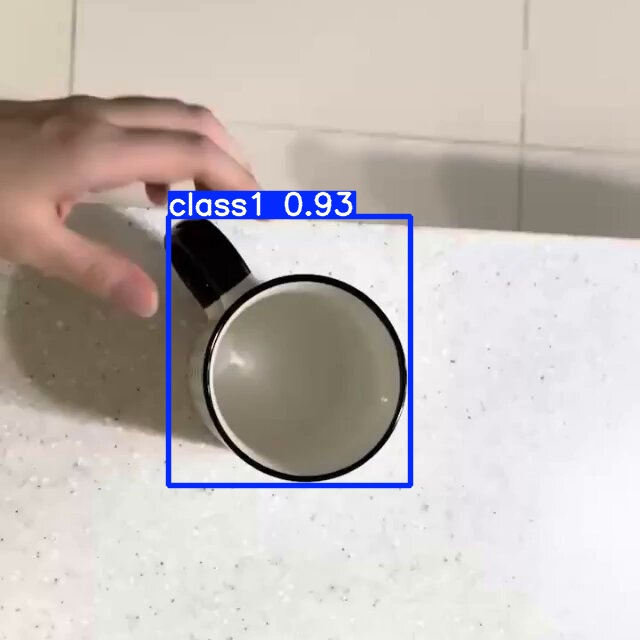

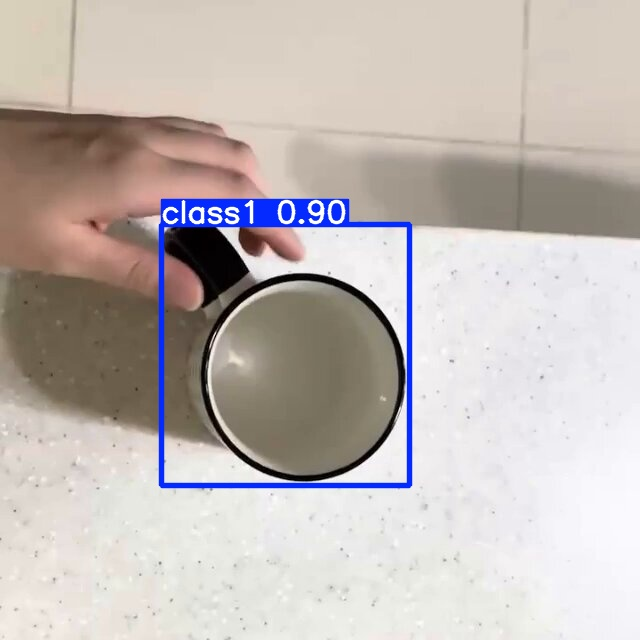

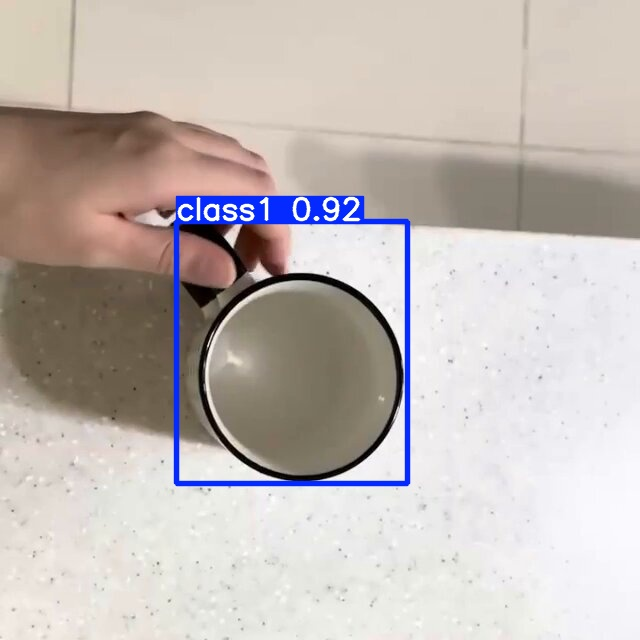

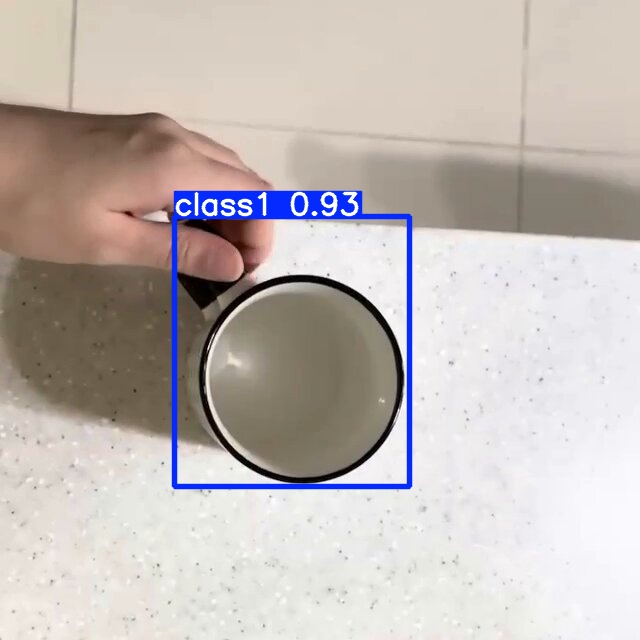

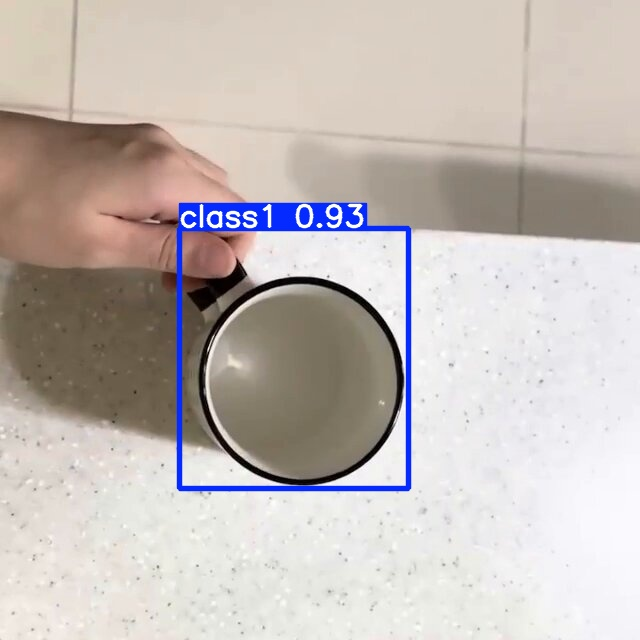

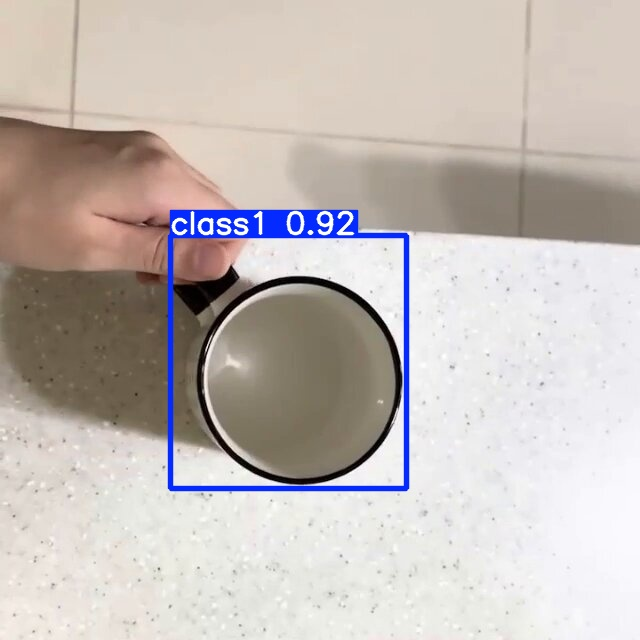

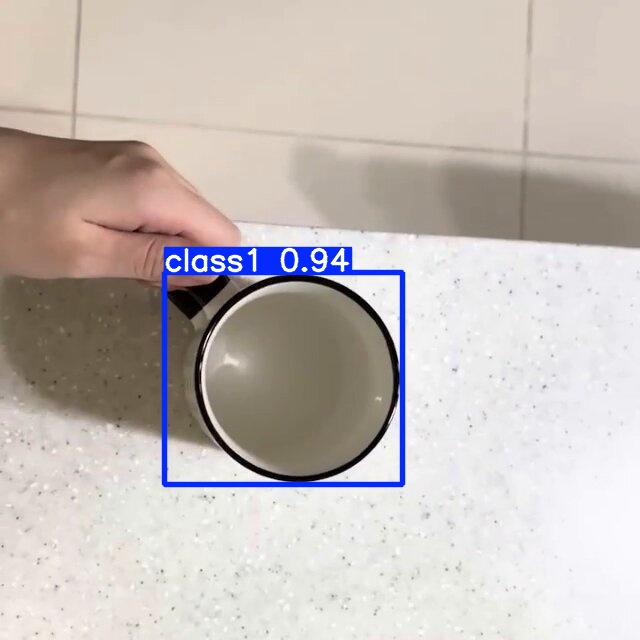

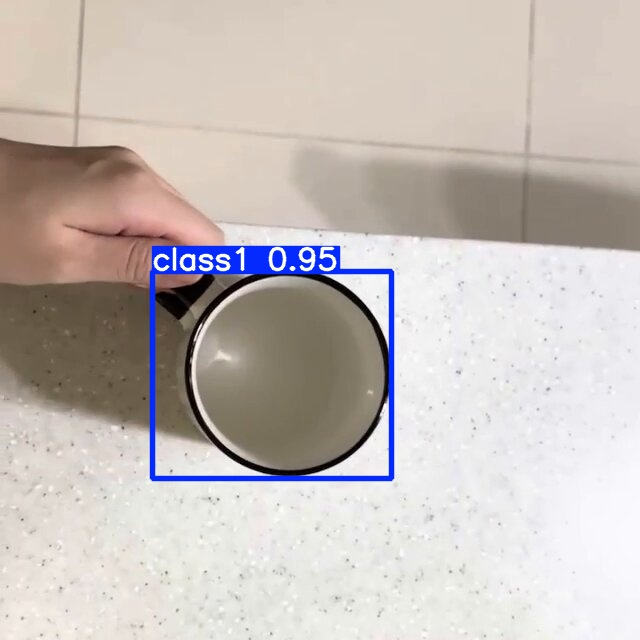

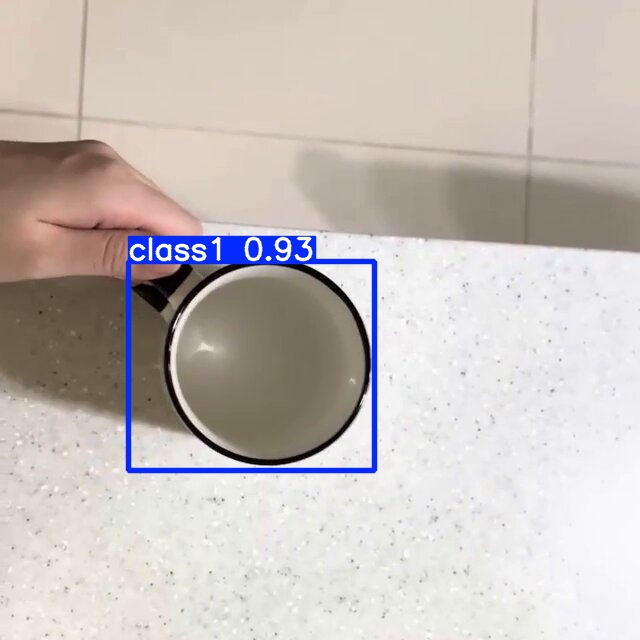

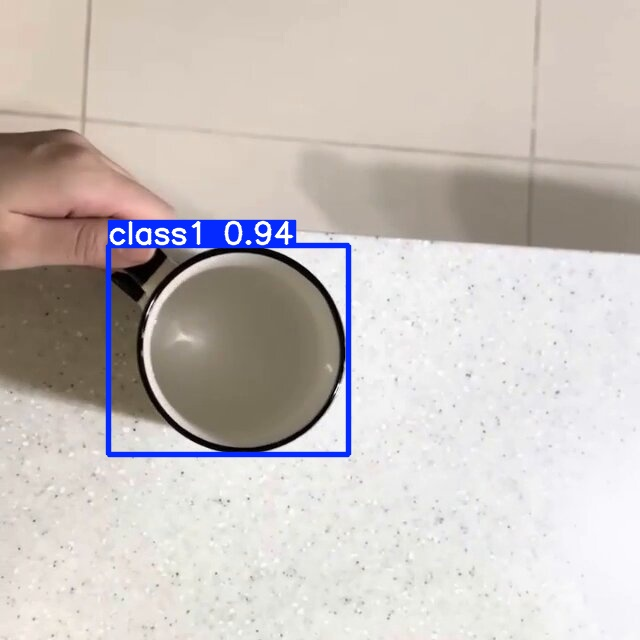

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp2/*.jpg')[:10]: #이미지 파일 형식에 맞춰 .png 또는 .jpg 등으로 수정
    display(Image(filename=imageName))
    print("\n")

# 실행 영상 추출

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 18.1 MB/s eta 0:00:00


In [ ]:
!python3 /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt --source /content/drive/MyDrive/cup.mp4

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/cup.mp4, data=drive/MyDrive/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=drive/MyDrive/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 1761871 parameters, 0 gradients, 4.1 GFLOPs
video 1/1 (1/325) /content/drive/MyDrive/cup.mp4: 640x640 1 class1, 184.3ms
video 1/1 (2/325) /content/drive/MyDrive/cup.mp4: 640x640 1 class1, 167.3ms
video 1/1 (3/325) /content/drive/MyDrive/cup.mp4: 640x640 1 class1, 153.1ms
video 1/1 (4/325) /content/d

In [ ]:
#사용 x
!python3 detect.py --weights /content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt --source /home/amap/yolov5/video/이름.mp4

python3: can't open file '/content/detect.py': [Errno 2] No such file or directory
